In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

works = pd.read_csv('ekoniva-dataset/works_new.csv')
fields = pd.read_csv('ekoniva-dataset/fields_new.csv')

In [2]:
df = works.merge(fields, 'left', on=['field', 'season'])
df = df.rename(columns={
    'area_x': 'completed_work_area',
    'area_y': 'field_area'
})

df = df[df['mech'] != 'НАЕМНЫЙ МЕХАНИЗАТОР']
df['yield_fact'] = df['prod_weight'] / df['completed_work_area']

In [3]:
df['work_type'].value_counts()

work_type
Уборка                56241
Обработка почвы       53421
Внесение СЗР          26383
Сев                   18045
Внесение удобрений    16548
Name: count, dtype: int64

In [4]:
df.columns

Index(['season', 'field', 'work_type', 'work_subtype', 'start_date',
       'end_date', 'completed_work_area', 'main_tech', 'add_tech', 'mech',
       'proc_depth', 'prod_purpose', 'prod_weight', 'Unnamed: 13',
       'Unnamed: 14', 'prod_dry_perc', 'prod_humid', 'prod_impur',
       'yield_fact', 'work_id', 'region', 'land_type', 'fertility_score',
       'crop', 'crop_predecessor', 'crop_yearold', 'field_area', 'hybrid',
       'reproduction', 'seed_origin', 'technology', 'yield_plan', 'p2o5',
       'k2o', 'humus', 'ph'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 170638 entries, 0 to 174682
Data columns (total 36 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   season               170638 non-null  int64  
 1   field                170638 non-null  object 
 2   work_type            170638 non-null  object 
 3   work_subtype         170638 non-null  object 
 4   start_date           170638 non-null  object 
 5   end_date             161638 non-null  object 
 6   completed_work_area  170638 non-null  float64
 7   main_tech            170638 non-null  object 
 8   add_tech             124025 non-null  object 
 9   mech                 170638 non-null  object 
 10  proc_depth           41556 non-null   float64
 11  prod_purpose         31688 non-null   object 
 12  prod_weight          170638 non-null  float64
 13  Unnamed: 13          160484 non-null  float64
 14  Unnamed: 14          160484 non-null  float64
 15  prod_dry_perc        1

In [6]:
df.head()

,season,field,work_type,work_subtype,start_date,end_date,completed_work_area,main_tech,add_tech,mech,...,field_area,hybrid,reproduction,seed_origin,technology,yield_plan,p2o5,k2o,humus,ph
0,2023,16.13.12.044.00,Обработка почвы,Боронование,2022-04-29 00:00:00,2022-04-30 00:00:00,49.78,"Трактор колесный Fendt 936 Vario, гос.ном. 050...",Арендованная техника,Ахметсафин Айрат Рафикович,...,49.78,Кинельская 100,NaN,NaN,NaN,1.24,197.67,192.33,6.0,5.63
1,2023,16.13.12.017.00,Обработка почвы,Боронование,2022-05-01 00:00:00,2022-05-02 00:00:00,154.76,"Трактор колесный Птз К-744Р4, гос.ном. 2251АА1...","Борона зубовая Veles АГС-22-2У.М, зав.ном. 789",Ямалетдинов Фарид Расыхович,...,235.76,Девятка,РС-1,Покупные,NaN,1.53,211.50,196.42,8.0,6.13
2,2023,16.13.12.012.00,Обработка почвы,Боронование,2022-05-02 00:00:00,2022-05-03 00:00:00,40.62,"Трактор колесный Fendt 936 Vario, гос.ном. 050...",Арендованная техника,Мухаметзянов Ринат Айратович,...,126.62,Сузука,F1,Покупные,классическая с плугом,1.70,225.00,196.67,7.8,6.67
3,2023,16.13.12.012.00,Обработка почвы,Боронование,2022-05-02 00:00:00,2022-05-03 00:00:00,86.00,"Трактор колесный Птз К-744Р4, гос.ном. 2251АА1...","Борона зубовая Veles АГС-22-2У.М, зав.ном. 789",Шакиров Ринат Галиевич,...,126.62,Сузука,F1,Покупные,классическая с плугом,1.70,225.00,196.67,7.8,6.67
4,2023,16.13.12.017.00,Обработка почвы,Боронование,2022-05-02 00:00:00,2022-05-03 00:00:00,76.00,"Трактор колесный Птз К-744Р4, гос.ном. 2251АА1...","Борона зубовая Veles АГС-22-2У.М, зав.ном. 789",Шакиров Ринат Галиевич,...,235.76,Девятка,РС-1,Покупные,NaN,1.53,211.50,196.42,8.0,6.13


In [7]:
df[df['yield_fact'] > 11].shape

(6528, 36)

In [8]:
df.shape

(170638, 36)

In [9]:
df[df['yield_fact'] > 11]['yield_fact'].min()

np.float64(11.005217391304347)

In [10]:
fields.head()

,field,region,land_type,fertility_score,season,crop,crop_predecessor,crop_yearold,area,hybrid,reproduction,seed_origin,technology,yield_plan,p2o5,k2o,humus,ph
0,22.47.01.001.01,Алтай,пашня,NaN,2023,Оз.пшеница мягкая,Пар; Яр.пшеница мягкая,NaN,306.22,Скипетр,ЭС,Покупные,минимальная,3.8,221.05,206.3,4.05,5.25
1,22.47.01.001.02,Алтай,пашня,NaN,2023,Пар,Пар; Яр.пшеница мягкая,NaN,63.16,NaN,NaN,NaN,минимальная,NaN,221.05,206.3,4.05,5.25
2,22.47.01.002.00,Алтай,пашня,4.0,2023,Пар,Яр.пшеница мягкая,NaN,485.79,NaN,NaN,NaN,NaN,NaN,199.80,186.0,3.50,5.20
3,22.47.01.003.00,Алтай,пашня,4.0,2023,Оз.пшеница мягкая,Пар,NaN,452.25,Скипетр,ЭС,Покупные,минимальная,3.8,186.50,174.8,5.90,5.40
4,22.47.01.004.00,Алтай,пашня,3.0,2023,Оз.пшеница мягкая,Пар,NaN,269.64,Скипетр,ЭС,Покупные,минимальная,3.8,166.60,147.9,5.60,5.40


In [11]:
fields[fields['field'] == '22.47.01.004.00'].head()

,field,region,land_type,fertility_score,season,crop,crop_predecessor,crop_yearold,area,hybrid,reproduction,seed_origin,technology,yield_plan,p2o5,k2o,humus,ph
4,22.47.01.004.00,Алтай,пашня,3.0,2023,Оз.пшеница мягкая,Пар,NaN,269.64,Скипетр,ЭС,Покупные,минимальная,3.8,166.6,147.9,5.6,5.4
7913,22.47.01.004.00,Алтай,пашня,3.0,2024,Пар,Оз.пшеница мягкая,NaN,269.64,NaN,NaN,NaN,NaN,NaN,166.6,147.9,5.6,5.4


In [12]:
fields[fields['season'] == 2024].head()

,field,region,land_type,fertility_score,season,crop,crop_predecessor,crop_yearold,area,hybrid,reproduction,seed_origin,technology,yield_plan,p2o5,k2o,humus,ph
7909,22.47.01.001.01,Алтай,пашня,NaN,2024,Пар,Оз.пшеница мягкая,NaN,306.22,NaN,NaN,NaN,NaN,NaN,221.05,206.3,4.05,5.25
7910,22.47.01.001.02,Алтай,пашня,NaN,2024,Пар,Пар,NaN,63.16,NaN,NaN,NaN,минимальная,NaN,221.05,206.3,4.05,5.25
7911,22.47.01.002.00,Алтай,пашня,4.0,2024,Оз.пшеница мягкая,Пар,NaN,485.79,Скипетр,РС-1,Покупные,минимальная,4.0,199.80,186.0,3.50,5.20
7912,22.47.01.003.00,Алтай,пашня,4.0,2024,Пар,Оз.пшеница мягкая,NaN,452.25,NaN,NaN,NaN,NaN,NaN,186.50,174.8,5.90,5.40
7913,22.47.01.004.00,Алтай,пашня,3.0,2024,Пар,Оз.пшеница мягкая,NaN,269.64,NaN,NaN,NaN,NaN,NaN,166.60,147.9,5.60,5.40


In [13]:
df[df['field'] == '22.47.01.001.01'].to_csv('econiva-small.csv')

In [14]:
df[df['field'] == '22.47.01.001.02'].to_csv('econiva-small__01_02.csv')

In [15]:
df[df['field'] == '22.47.01.002.00'].to_csv('econiva-small__02_01.csv')

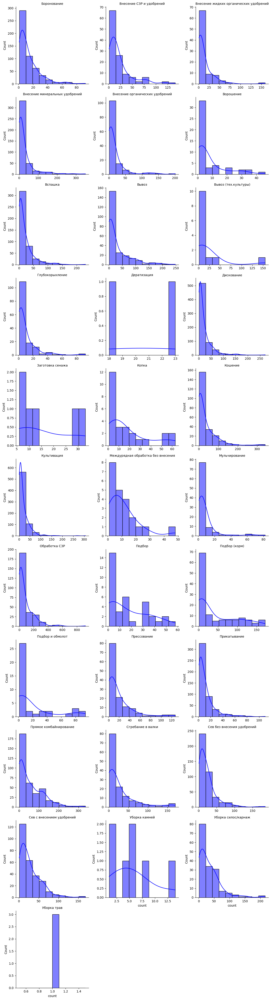

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

subtype_counts = df.groupby(['work_subtype', 'mech']).size().reset_index(name='count')

g = sns.FacetGrid(subtype_counts, col='work_subtype', col_wrap=3, height=4, sharex=False, sharey=False)
g.map(sns.histplot, 'count', bins=10, kde=True, color='blue')

g.set_titles(col_template='{col_name}', fontsize=14)

plt.tight_layout()
plt.show()

In [17]:
grouped = df.groupby(['mech', 'work_type', 'work_subtype']).agg(amount_of_work=('work_subtype', 'count'), total_completed_work_area=('completed_work_area', 'sum')).reset_index()
grouped = grouped.sort_values(by=['mech', 'work_subtype', 'total_completed_work_area'], ascending=[True, True, False]).reset_index()

print(grouped.head(15))

    index                     mech           work_type  \
0       0             Admin MS SQL              Уборка   
1       1   Абабков Данил Павлович        Внесение СЗР   
2       5  Абдулов Руслан Флюрович     Обработка почвы   
3       3  Абдулов Руслан Флюрович  Внесение удобрений   
4       4  Абдулов Руслан Флюрович  Внесение удобрений   
5       6  Абдулов Руслан Флюрович     Обработка почвы   
6      13  Абдулов Руслан Флюрович              Уборка   
7       7  Абдулов Руслан Флюрович     Обработка почвы   
8       8  Абдулов Руслан Флюрович     Обработка почвы   
9      14  Абдулов Руслан Флюрович              Уборка   
10      9  Абдулов Руслан Флюрович     Обработка почвы   
11     10  Абдулов Руслан Флюрович     Обработка почвы   
12      2  Абдулов Руслан Флюрович        Внесение СЗР   
13     15  Абдулов Руслан Флюрович              Уборка   
14     11  Абдулов Руслан Флюрович     Обработка почвы   

                              work_subtype  amount_of_work  \
0        

In [18]:
grouped = df.groupby(['mech', 'work_type', 'work_subtype']).agg(
    amount_of_work=('work_subtype', 'count'),
    total_completed_work_area=('completed_work_area', 'sum')
).reset_index()

grouped['specialization_index'] = grouped['amount_of_work'] * grouped['total_completed_work_area']

grouped['cumulative_sum'] = grouped.groupby('mech')['total_completed_work_area'].cumsum()
grouped['total_work_area_per_mech'] = grouped.groupby('mech')['total_completed_work_area'].transform('sum')
grouped['cumulative_percentage'] = grouped['cumulative_sum'] / grouped['total_work_area_per_mech']

grouped = grouped.sort_values(by=['mech', 'specialization_index'], ascending=[True, False])

print(grouped)

                           mech        work_type                work_subtype  \
0                  Admin MS SQL           Уборка      Прямое комбайнирование   
1        Абабков Данил Павлович     Внесение СЗР               Обработка СЗР   
13      Абдулов Руслан Флюрович           Уборка                       Вывоз   
15      Абдулов Руслан Флюрович           Уборка               Подбор (корм)   
5       Абдулов Руслан Флюрович  Обработка почвы                 Боронование   
...                         ...              ...                         ...   
6442  Яркин Михаил Владимирович           Уборка                       Копка   
6439  Яркин Михаил Владимирович              Сев  Сев без внесения удобрений   
6436  Яркин Михаил Владимирович     Внесение СЗР               Обработка СЗР   
6438  Яркин Михаил Владимирович  Обработка почвы                Прикатывание   
6437  Яркин Михаил Владимирович  Обработка почвы                 Боронование   

      amount_of_work  total_completed_w

In [19]:
df.iloc[74395]

season                                                              2023
field                                                    54.17.08.041.01
work_type                                                         Уборка
work_subtype                                                     Кошение
start_date                                           2023-08-22 00:00:00
end_date                                             2023-08-22 00:00:00
completed_work_area                                                  3.0
main_tech              Косилка самоходная Massey Ferguson WR9840, гос...
add_tech               Жатка валковая Challenger 910DS, зав.ном. AGCO...
mech                                        Колесников Дмитрий Андреевич
proc_depth                                                           NaN
prod_purpose                                                         NaN
prod_weight                                                          0.0
Unnamed: 13                                        

In [20]:
def calculate_cumsum_and_total(group):
    # Накопительная сумма для каждого work_subtype
    group['cumsum_subwork_area'] = group.groupby('work_subtype')['completed_work_area'].cumsum()
    
    # Общая сумма по work_subtype
    group['total_subwork_area'] = group.groupby('work_subtype')['completed_work_area'].transform('sum')
    
    return group

# Применяем функцию к каждой группе mech
df = df.groupby('mech').apply(calculate_cumsum_and_total).reset_index(drop=True)
df['total_area_for_mech'] = df.groupby('mech')['completed_work_area'].transform('sum')
df['cumsum_area'] = df.groupby('mech')['completed_work_area'].cumsum()

df['Metric_Area'] = df['cumsum_subwork_area'] / df['cumsum_area']

/var/folders/pn/0bn7dksx05d8k5q8rpx3vxm80000gn/T/ipykernel_81433/1819811645.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('mech').apply(calculate_cumsum_and_total).reset_index(drop=True)


In [21]:
df['start_date'] = pd.to_datetime(df['start_date'])
df = df.sort_values(by='start_date')

In [22]:
df['work_number'] = df.groupby(['mech', 'work_subtype']).cumcount() + 1

In [23]:
def count_unique_before(group):
    group['is_new_subtype'] = ~group['work_subtype'].duplicated()
    group['unique_works_before'] = group['is_new_subtype'].cumsum()
    return group

df = df.groupby('mech').apply(count_unique_before).reset_index(drop=True)
df.drop(columns=['is_new_subtype'], inplace=True)

/var/folders/pn/0bn7dksx05d8k5q8rpx3vxm80000gn/T/ipykernel_81433/241992069.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('mech').apply(count_unique_before).reset_index(drop=True)


In [24]:
df['works_before'] = df.groupby('mech').cumcount() + 1

In [56]:
df['start_date'] = pd.to_datetime(df['start_date'])
df['month'] = df['start_date'].dt.to_period('M')
df['cumsum_subwork_area'] = df.groupby(['mech', 'month', 'work_subtype'])['completed_work_area'].cumsum()
df['cumsum_area'] = df.groupby(['mech', 'month'])['completed_work_area'].cumsum()
df['MetricMonth'] = df['cumsum_subwork_area'] / df['cumsum_area']

In [57]:
df['start_date'] = pd.to_datetime(df['start_date'])
df['year'] = df['start_date'].dt.to_period('Y')
df['cumsum_subwork_area'] = df.groupby(['mech', 'year', 'work_subtype'])['completed_work_area'].cumsum()
df['cumsum_area'] = df.groupby(['mech', 'year'])['completed_work_area'].cumsum()
df['MetricYear'] = df['cumsum_subwork_area'] / df['cumsum_area']

In [58]:
df['cumsum_subwork_area'] = df.groupby(['mech', 'season', 'work_subtype'])['completed_work_area'].cumsum()
df['cumsum_area'] = df.groupby(['mech', 'season'])['completed_work_area'].cumsum()
df['MetricSeason'] = df['cumsum_subwork_area'] / df['cumsum_area']

In [26]:
df[df['mech'] == 'Яркин Михаил Владимирович'].head()

,season,field,work_type,work_subtype,start_date,end_date,completed_work_area,main_tech,add_tech,mech,...,cumsum_subwork_area,total_subwork_area,total_area_for_mech,cumsum_area,Metric_Area,work_number,unique_works_before,works_before,month,Metric
170212,2023,36.14.02.033.00,Обработка почвы,Боронование,2023-04-07,2023-04-07 00:00:00,34.34,"Трактор колесный John Deere 6195M, гос.ном. 70...",Борона пружинная штригель Einbock Aerostar 120...,Яркин Михаил Владимирович,...,34.34,71.840,9218.028,34.34,1.000000,1,1,1,2023-04,1.000000
170213,2023,36.14.03.044.00,Обработка почвы,Боронование,2023-04-07,2023-04-07 00:00:00,37.50,"Трактор колесный John Deere 6195M, гос.ном. 70...",Борона пружинная штригель Einbock Aerostar 120...,Яркин Михаил Владимирович,...,71.84,71.840,9218.028,71.84,1.000000,2,1,2,2023-04,1.000000
170214,2023,36.14.19.051.00,Обработка почвы,Прикатывание,2023-04-10,2023-04-10 00:00:00,102.14,"Трактор колесный John Deere 6195M, гос.ном. 79...",NaN,Яркин Михаил Владимирович,...,102.14,143.760,9218.028,173.98,0.666790,1,2,3,2023-04,0.587079
170215,2023,36.14.19.037.00,Обработка почвы,Прикатывание,2023-04-10,2023-04-10 00:00:00,41.62,"Трактор колесный John Deere 6195M, гос.ном. 79...",NaN,Яркин Михаил Владимирович,...,143.76,143.760,9218.028,215.60,0.366825,2,2,4,2023-04,0.666790
170216,2023,36.14.19.025.00,Сев,Сев без внесения удобрений,2023-04-18,2023-04-18 00:00:00,5.00,"Трактор колесный John Deere 7830, гос.ном. 033...","Сеялка пропашная Kverneland Monopill SE, инв.н...",Яркин Михаил Владимирович,...,5.00,310.329,9218.028,220.60,0.228898,1,3,5,2023-04,0.022665


In [27]:
df[df['mech'] == 'Ульвачев Алексей Николаевич']['work_subtype'].value_counts()

work_subtype
Подбор (корм)                 147
Уборка силос/карнаж            50
Подбор                         35
Сев с внесением удобрений      29
Культивация                    20
Сев без внесения удобрений     14
Прикатывание                    7
Вывоз                           1
Прямое комбайнирование          1
Name: count, dtype: int64

In [28]:
df['hybrid'].unique()

array(['ЭН Аргента', 'Фаусто ШТ', 'Скипетр', nan, 'Пензяк', 'Каскад 166',
       'Сузука', 'Росс 140 СВ', 'Новамис', 'Кермит', '(нет сорта)',
       'П 62 ЛЕ 122', 'Рэдкот', 'Сарга', 'БН 06-18', 'БН 06-17', 'Дакота',
       'Песчаный 1251', 'Северный', 'Смесь сортов', 'Фаусто', 'Дорка',
       'Сурус', 'Талисман', 'Безенчукская Крепость', 'Безенчукская 210',
       'Сапсан', 'Кинельская 100', 'Авиатор', 'Вега 87', 'П 63 ЛЕ 10',
       'Слон', 'Безенчукская Золотистая', 'ЛГ 30179', 'Креатив',
       'Чоринтос', 'Золотой початок 200 СВ', 'Максалия', 'Адевей',
       'КСС 7270', 'Эксплоер', 'Ликамеро', 'Тренди', 'Аргумет',
       'Памяти Фадеева', 'Золотистая', 'Иртыш 22', 'Руби', 'Паола',
       'Нарымская', 'ВИК-90', 'ВИК-66', 'Изумрудный 1', 'Цефей',
       'Каликсо', 'Сиберия', 'Канюк', 'Маргрет', 'Рэдбоу', 'ЛГ 30215',
       'Бьорк', 'Дельфин', 'Воронежский 158', 'П 7043', 'Галифакс',
       'РОСС-195', 'Девятка', 'Сумико', 'ЛГ 50479', 'ОАК Пруденс',
       'Акцент', 'ЛГ 30189', 'Джо

In [29]:
df

,season,field,work_type,work_subtype,start_date,end_date,completed_work_area,main_tech,add_tech,mech,...,cumsum_subwork_area,total_subwork_area,total_area_for_mech,cumsum_area,Metric_Area,work_number,unique_works_before,works_before,month,Metric
0,2024,46.22.03.005.00,Уборка,Прямое комбайнирование,2024-09-13,2024-09-13 00:00:00,8.40,Арендованная техника,Арендованная техника,Admin MS SQL,...,8.40,8.40,8.400,8.40,1.000000,1,1,1,2024-09,1.0
1,2024,02.09.08.041.00,Внесение СЗР,Обработка СЗР,2024-09-17,NaN,95.86,Арендованная техника,NaN,Абабков Данил Павлович,...,95.86,95.86,95.860,95.86,1.000000,1,1,1,2024-09,1.0
2,2023,02.09.09.011.00,Обработка почвы,Боронование,2022-08-13,NaN,46.09,"Трактор колесный Ростсельмаш 2400, зав.ном. R0...","Борона зубовая Veles АГС-22-2У.М, зав.ном. 785",Абдулов Руслан Флюрович,...,46.09,1051.59,9557.940,46.09,1.000000,1,1,1,2022-08,1.0
3,2023,02.09.09.012.00,Обработка почвы,Боронование,2022-08-13,NaN,91.10,"Трактор колесный Ростсельмаш 2400, зав.ном. R0...",НЕТ В 1С Борона зубовая Veles АГС-22-2У.М зав....,Абдулов Руслан Флюрович,...,137.19,1051.59,9557.940,137.19,1.000000,2,1,2,2022-08,1.0
4,2023,02.09.08.006.00,Обработка почвы,Боронование,2022-08-14,NaN,20.00,"Трактор колесный Ростсельмаш 2400, зав.ном. R0...","Борона зубовая Veles АГС-22-2У.М, зав.ном. 775",Абдулов Руслан Флюрович,...,157.19,1051.59,9557.940,157.19,1.000000,3,1,3,2022-08,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170633,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-16,2024-10-16 00:00:00,16.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,169.46,429.08,9218.028,169.46,0.037374,34,10,422,2024-10,1.0
170634,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-17,2024-10-17 00:00:00,11.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,180.46,429.08,9218.028,180.46,0.038532,35,10,423,2024-10,1.0
170635,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-18,2024-10-18 00:00:00,11.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,191.46,429.08,9218.028,191.46,0.039688,36,10,424,2024-10,1.0
170636,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-19,2024-10-19 00:00:00,31.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,222.46,429.08,9218.028,222.46,0.042930,37,10,425,2024-10,1.0


In [30]:
df[df['mech'] == 'Яркин Михаил Владимирович']['work_subtype'].value_counts()

work_subtype
Вывоз                         163
Подбор (корм)                  99
Уборка силос/карнаж            67
Вывоз (тех.культуры)           38
Копка                          25
Подбор                         17
Сев без внесения удобрений      9
Обработка СЗР                   4
Боронование                     2
Прикатывание                    2
Name: count, dtype: int64

In [31]:
df['metric'] = df['work_number'] / df['works_before']

In [32]:
df[df['mech'] == 'Яркин Михаил Владимирович']['work_subtype'].value_counts()

work_subtype
Вывоз                         163
Подбор (корм)                  99
Уборка силос/карнаж            67
Вывоз (тех.культуры)           38
Копка                          25
Подбор                         17
Сев без внесения удобрений      9
Обработка СЗР                   4
Боронование                     2
Прикатывание                    2
Name: count, dtype: int64

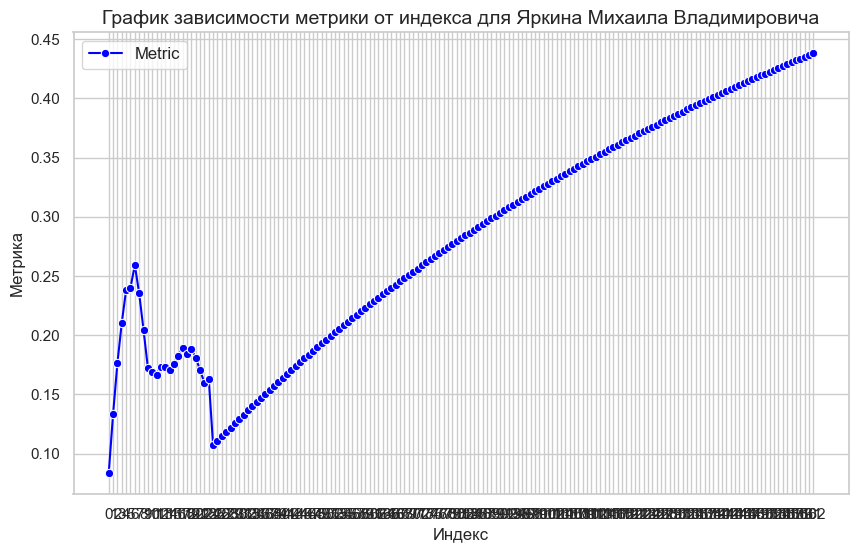

In [33]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Вывоз')].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='metric', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)

plt.show()

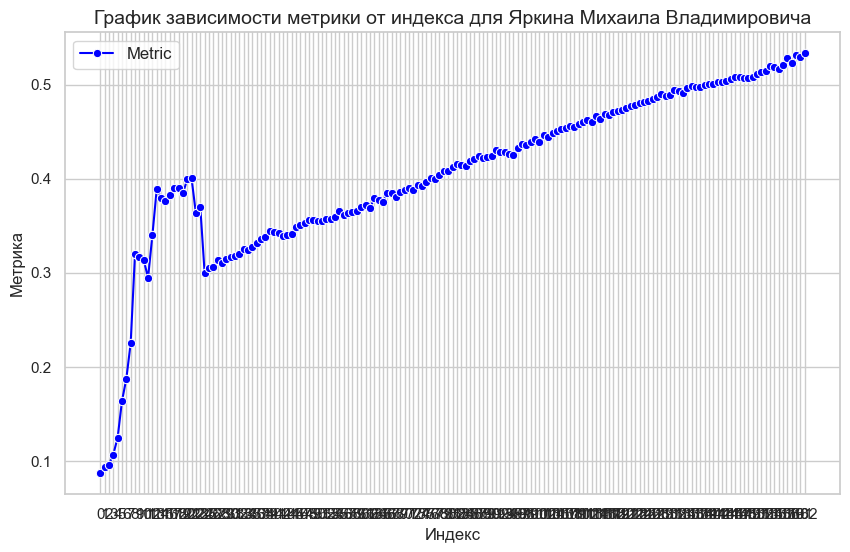

In [34]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Вывоз')].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='Metric_Area', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)

plt.show()

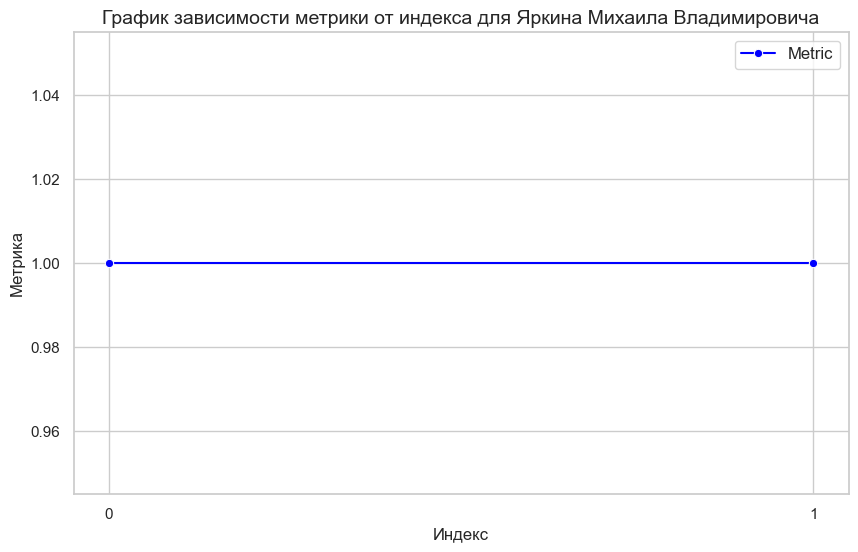

In [35]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Боронование')].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='metric', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)

plt.show()

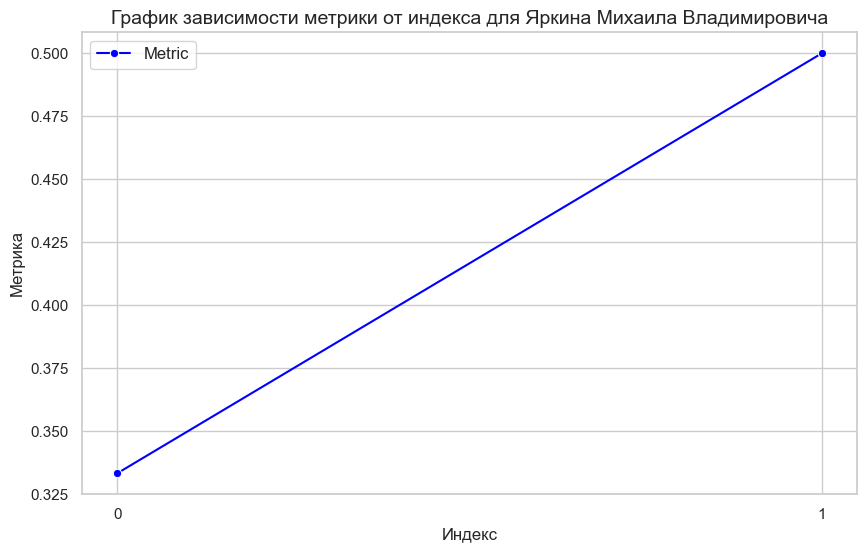

In [36]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Прикатывание')].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='metric', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)

plt.show()

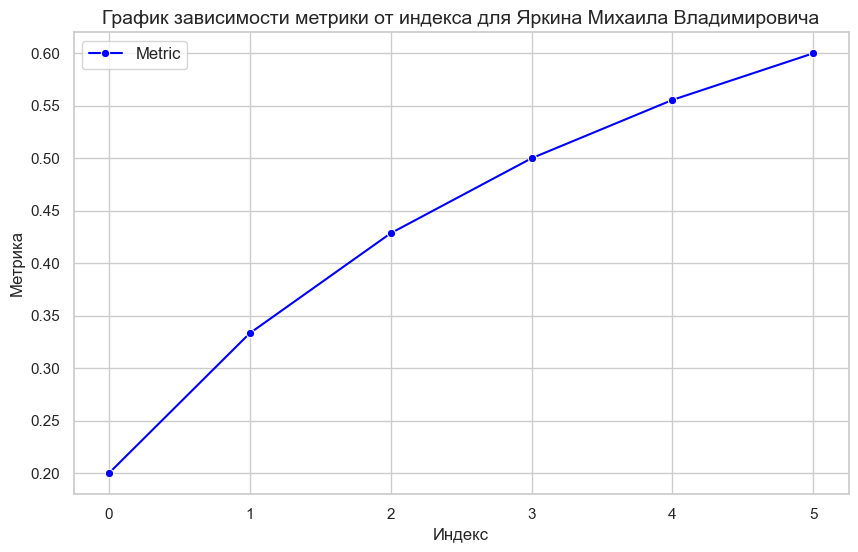

In [37]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Сев без внесения удобрений') & (df['season'] == 2023)].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='metric', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)
plt.show()

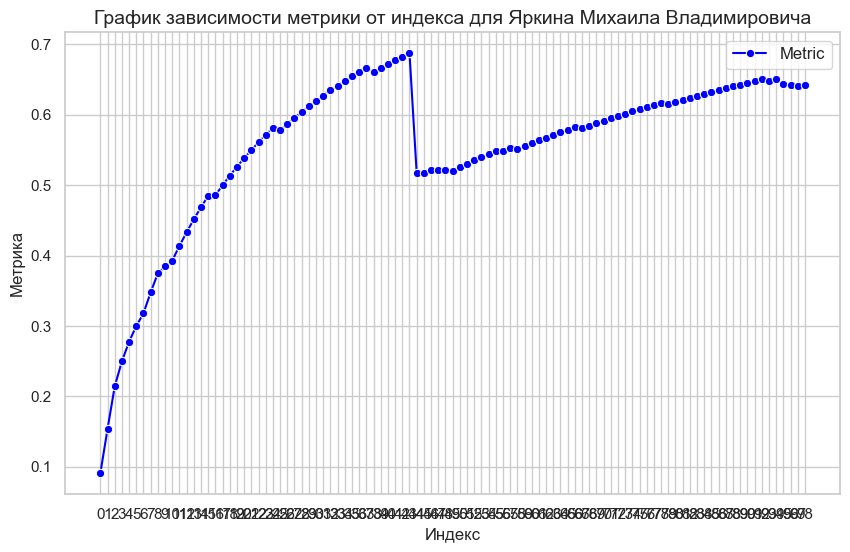

In [38]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Подбор (корм)')].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='metric', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)

plt.show()

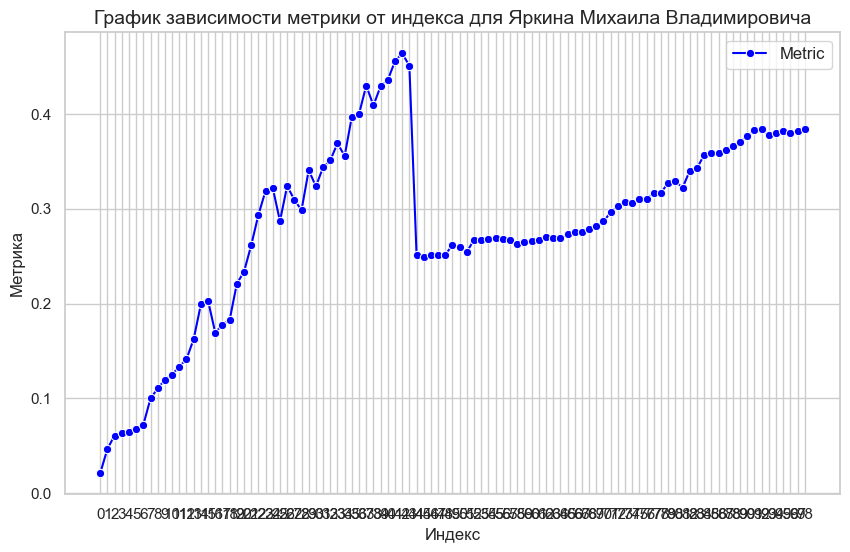

In [39]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Подбор (корм)')].reset_index(drop=True)

filtered_df['index'] = filtered_df.index

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.lineplot(data=filtered_df, x='index', y='Metric_Area', marker='o', color='blue', label='Metric')

plt.title('График зависимости метрики от индекса для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Индекс', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.xticks(filtered_df['index'])
plt.grid(True)

plt.show()

In [40]:
filtered_df.head()

,season,field,work_type,work_subtype,start_date,end_date,completed_work_area,main_tech,add_tech,mech,...,total_area_for_mech,cumsum_area,Metric_Area,work_number,unique_works_before,works_before,month,Metric,metric,index
0,2023,36.14.02.034.00,Уборка,Подбор (корм),2023-05-13,2023-05-13 00:00:00,8.60,"Комбайн кормоуборочный John Deere 7480, гос.но...","Подборщик John Deere 630C, инв.ном. 140329, за...",Яркин Михаил Владимирович,...,9218.028,27.599,0.021147,1,4,11,2023-05,0.311605,0.090909,0
1,2023,36.14.02.039.00,Уборка,Подбор (корм),2023-05-13,2023-05-13 00:00:00,12.90,"Комбайн кормоуборочный John Deere 7480, гос.но...","Подборщик John Deere 630C, инв.ном. 140329, за...",Яркин Михаил Владимирович,...,9218.028,79.299,0.046904,2,5,13,2023-05,0.271126,0.153846,1
2,2023,36.14.02.059.00,Уборка,Подбор (корм),2023-05-13,2023-05-13 00:00:00,6.84,"Комбайн кормоуборочный John Deere 7480, гос.но...","Подборщик John Deere 630C, инв.ном. 140329, за...",Яркин Михаил Владимирович,...,9218.028,86.139,0.060918,3,5,14,2023-05,0.329003,0.214286,2
3,2023,36.14.02.065.00,Уборка,Подбор (корм),2023-05-13,2023-05-13 00:00:00,1.80,"Комбайн кормоуборочный John Deere 7480, гос.но...","Подборщик John Deere 630C, инв.ном. 140329, за...",Яркин Михаил Владимирович,...,9218.028,93.409,0.063790,4,5,16,2023-05,0.322667,0.250000,3
4,2023,36.14.02.066.00,Уборка,Подбор (корм),2023-05-13,2023-05-13 00:00:00,0.46,"Комбайн кормоуборочный John Deere 7480, гос.но...","Подборщик John Deere 630C, инв.ном. 140329, за...",Яркин Михаил Владимирович,...,9218.028,95.259,0.064511,5,5,18,2023-05,0.321229,0.277778,4


In [41]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович')].reset_index(drop=True)
filtered_df['index'] = filtered_df.index
filtered_df[['index', 'mech', 'work_subtype', 'yield_fact', 'metric']].to_csv('Яркин Михаил Владимирович	Метрики.csv')

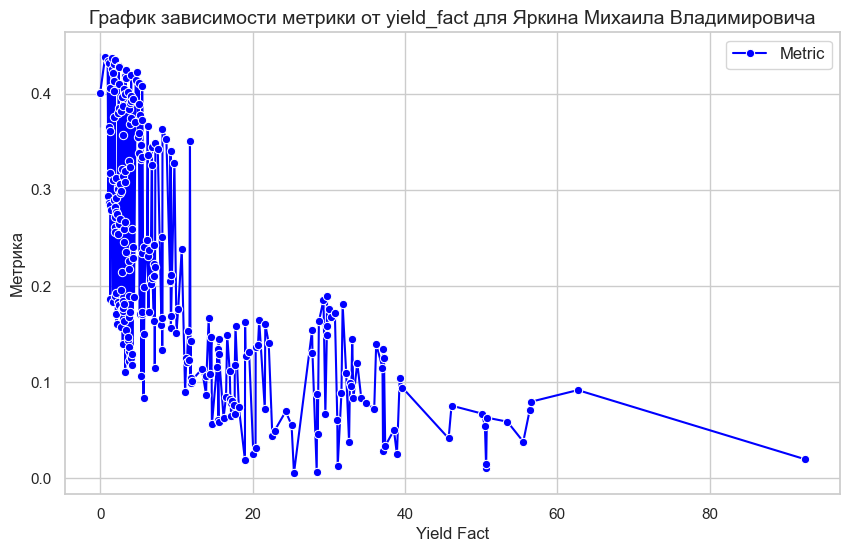

In [42]:
filtered_df = df[df['mech'] == 'Яркин Михаил Владимирович']

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим график
sns.lineplot(data=filtered_df, x='yield_fact', y='metric', marker='o', color='blue', label='Metric')

# Настройка графика
plt.title('График зависимости метрики от yield_fact для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Yield Fact', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

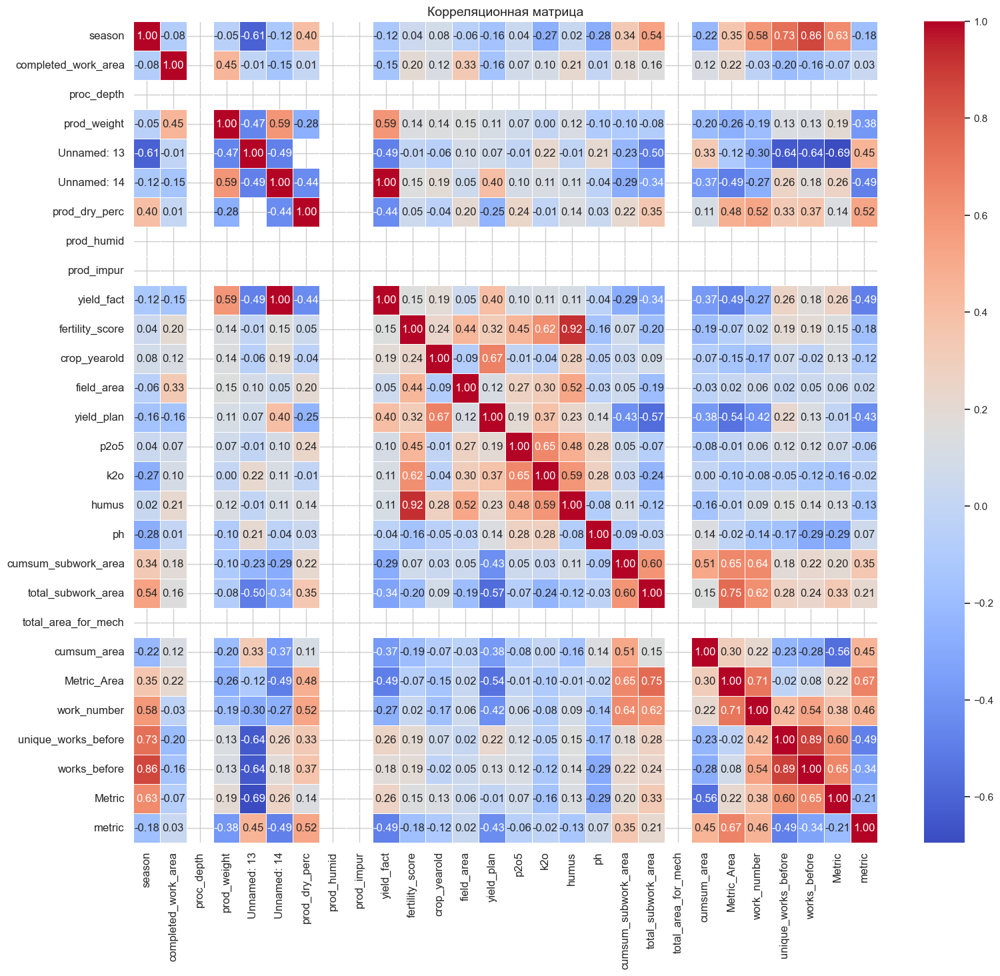

In [43]:
filtered_df = df[df['mech'] == 'Яркин Михаил Владимирович']

numeric_df = filtered_df.select_dtypes(include='number')
correlation_matrix = numeric_df.corr()
# Визуализация корреляционной матрицы с помощью seaborn
plt.figure(figsize=(18, 16))  # Устанавливаем размер графика
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Настройка графика
plt.title('Корреляционная матрица', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Показываем график
plt.show()

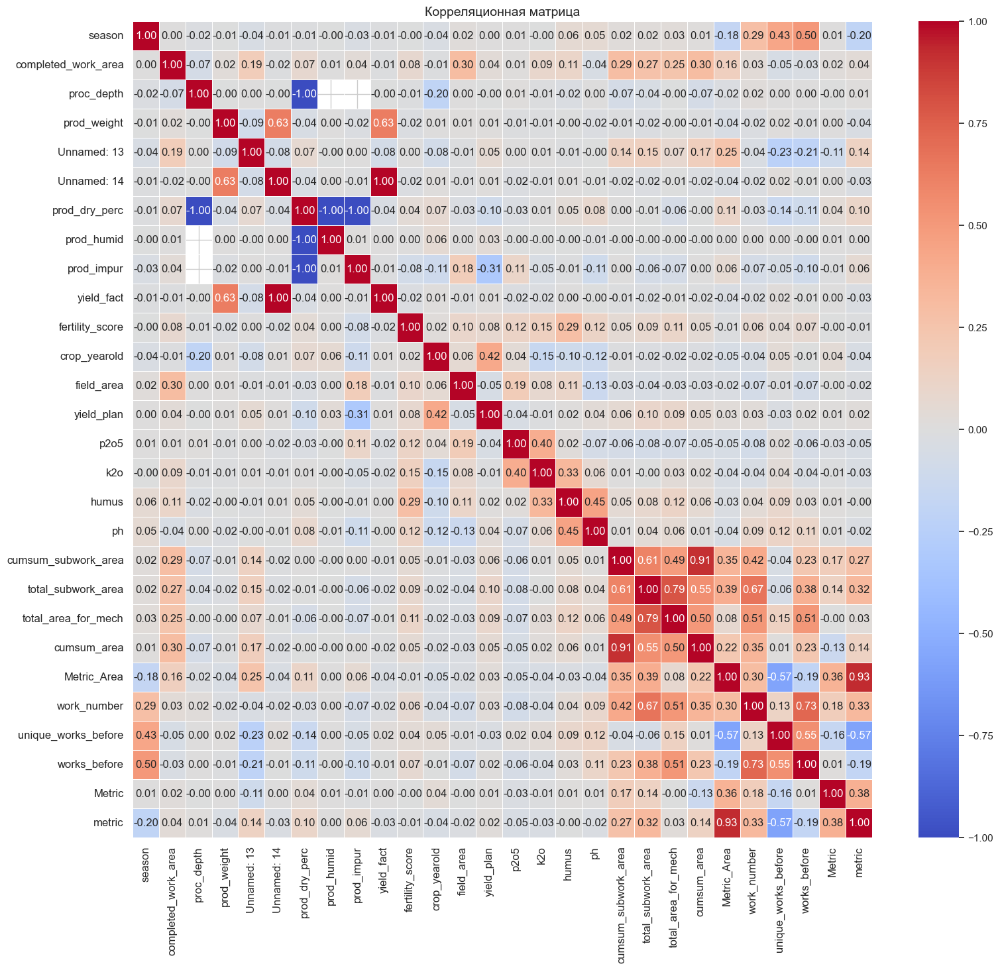

In [44]:
numeric_df = df.select_dtypes(include='number')
correlation_matrix = numeric_df.corr()
# Визуализация корреляционной матрицы с помощью seaborn
plt.figure(figsize=(18, 16))  # Устанавливаем размер графика
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Настройка графика
plt.title('Корреляционная матрица', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Показываем график
plt.show()

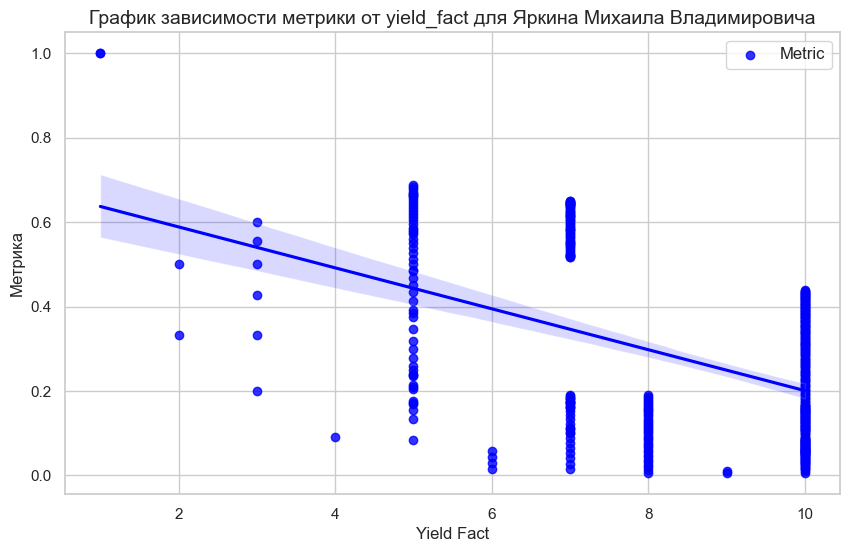

In [45]:
filtered_df = df[df['mech'] == 'Яркин Михаил Владимирович']

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим график
sns.regplot(data=filtered_df, x='unique_works_before', y='metric', marker='o', color='blue', label='Metric')

# Настройка графика
plt.title('График зависимости метрики от yield_fact для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Yield Fact', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

In [46]:
df[(df['mech'] == 'Яркин Михаил Владимирович')]

,season,field,work_type,work_subtype,start_date,end_date,completed_work_area,main_tech,add_tech,mech,...,total_subwork_area,total_area_for_mech,cumsum_area,Metric_Area,work_number,unique_works_before,works_before,month,Metric,metric
170212,2023,36.14.02.033.00,Обработка почвы,Боронование,2023-04-07,2023-04-07 00:00:00,34.34,"Трактор колесный John Deere 6195M, гос.ном. 70...",Борона пружинная штригель Einbock Aerostar 120...,Яркин Михаил Владимирович,...,71.840,9218.028,34.34,1.000000,1,1,1,2023-04,1.000000,1.000000
170213,2023,36.14.03.044.00,Обработка почвы,Боронование,2023-04-07,2023-04-07 00:00:00,37.50,"Трактор колесный John Deere 6195M, гос.ном. 70...",Борона пружинная штригель Einbock Aerostar 120...,Яркин Михаил Владимирович,...,71.840,9218.028,71.84,1.000000,2,1,2,2023-04,1.000000,1.000000
170214,2023,36.14.19.051.00,Обработка почвы,Прикатывание,2023-04-10,2023-04-10 00:00:00,102.14,"Трактор колесный John Deere 6195M, гос.ном. 79...",NaN,Яркин Михаил Владимирович,...,143.760,9218.028,173.98,0.666790,1,2,3,2023-04,0.587079,0.333333
170215,2023,36.14.19.037.00,Обработка почвы,Прикатывание,2023-04-10,2023-04-10 00:00:00,41.62,"Трактор колесный John Deere 6195M, гос.ном. 79...",NaN,Яркин Михаил Владимирович,...,143.760,9218.028,215.60,0.366825,2,2,4,2023-04,0.666790,0.500000
170216,2023,36.14.19.025.00,Сев,Сев без внесения удобрений,2023-04-18,2023-04-18 00:00:00,5.00,"Трактор колесный John Deere 7830, гос.ном. 033...","Сеялка пропашная Kverneland Monopill SE, инв.н...",Яркин Михаил Владимирович,...,310.329,9218.028,220.60,0.228898,1,3,5,2023-04,0.022665,0.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170633,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-16,2024-10-16 00:00:00,16.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,429.080,9218.028,169.46,0.037374,34,10,422,2024-10,1.000000,0.080569
170634,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-17,2024-10-17 00:00:00,11.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,429.080,9218.028,180.46,0.038532,35,10,423,2024-10,1.000000,0.082742
170635,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-18,2024-10-18 00:00:00,11.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,429.080,9218.028,191.46,0.039688,36,10,424,2024-10,1.000000,0.084906
170636,2024,36.14.02.007.00,Уборка,Вывоз (тех.культуры),2024-10-19,2024-10-19 00:00:00,31.00,"Погрузчик свеклы Ropa euro-Maus 3, гос.ном. 65...",NaN,Яркин Михаил Владимирович,...,429.080,9218.028,222.46,0.042930,37,10,425,2024-10,1.000000,0.087059


        season            field work_type         work_subtype start_date  \
170366    2023  36.14.02.014.00    Уборка  Уборка силос/карнаж 2023-08-20   
170367    2023  36.14.02.014.00    Уборка  Уборка силос/карнаж 2023-08-22   
170368    2023  36.14.02.032.00    Уборка  Уборка силос/карнаж 2023-08-23   
170369    2023  36.14.02.022.00    Уборка  Уборка силос/карнаж 2023-08-24   
170370    2023  36.14.02.032.00    Уборка  Уборка силос/карнаж 2023-08-24   
...        ...              ...       ...                  ...        ...   
170610    2024  36.14.19.049.00    Уборка  Уборка силос/карнаж 2024-08-31   
170611    2024  36.14.19.050.00    Уборка  Уборка силос/карнаж 2024-09-03   
170612    2024  36.14.19.041.00    Уборка  Уборка силос/карнаж 2024-09-03   
170613    2024  36.14.19.039.00    Уборка  Уборка силос/карнаж 2024-09-05   
170614    2024  36.14.19.041.00    Уборка  Уборка силос/карнаж 2024-09-05   

                   end_date  completed_work_area  \
170366  2023-08-20 00:0

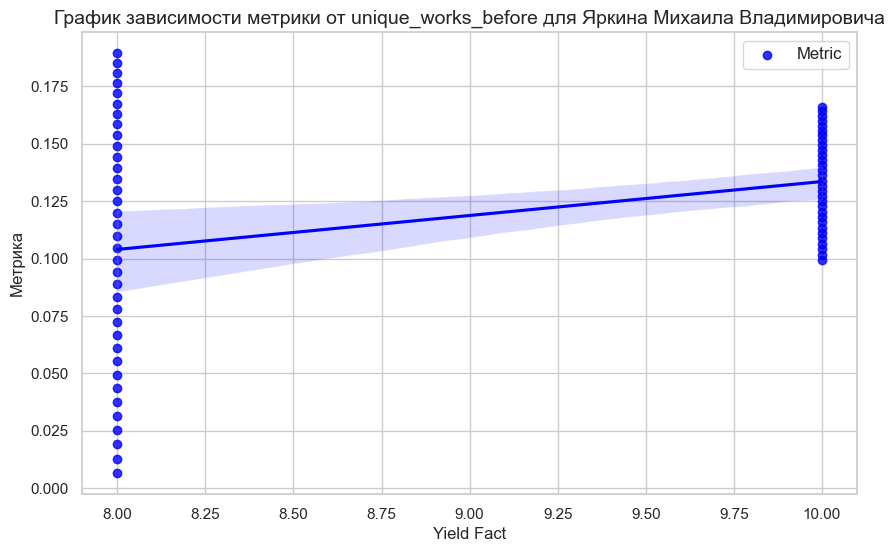

In [47]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_subtype'] == 'Уборка силос/карнаж')]

print(filtered_df)
# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим график
sns.regplot(data=filtered_df, x='unique_works_before', y='metric', marker='o', color='blue', label='Metric')

# Настройка графика
plt.title('График зависимости метрики от unique_works_before для Яркина Михаила Владимировича', fontsize=14)
plt.xlabel('Yield Fact', fontsize=12)
plt.ylabel('Метрика', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

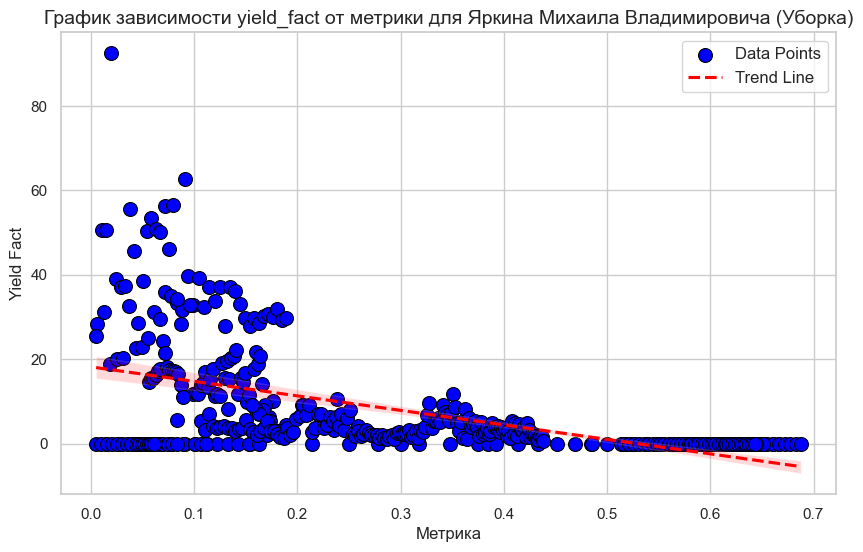

In [48]:
filtered_df = df[(df['mech'] == 'Яркин Михаил Владимирович') & (df['work_type'] == 'Уборка')]

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим график зависимости yield_fact от метрики
sns.scatterplot(data=filtered_df, x='metric', y='yield_fact', color='blue', s=100, edgecolor='black', label='Data Points')

# Добавляем линию тренда
sns.regplot(data=filtered_df, x='metric', y='yield_fact', scatter=False, color='red', line_kws={'linestyle': '--'}, label='Trend Line')

# Настройка графика
plt.title('График зависимости yield_fact от метрики для Яркина Михаила Владимировича (Уборка)', fontsize=14)
plt.xlabel('Метрика', fontsize=12)
plt.ylabel('Yield Fact', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

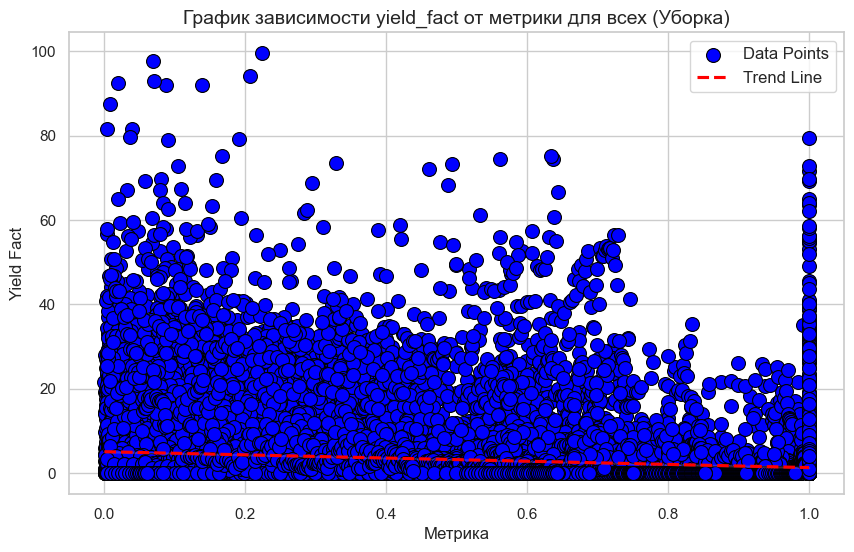

In [49]:
filtered_df = df[(df['work_type'] == 'Уборка') & (df['yield_fact'] < 100)]

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим график зависимости yield_fact от метрики
sns.scatterplot(data=filtered_df, x='metric', y='yield_fact', color='blue', s=100, edgecolor='black', label='Data Points')

# Добавляем линию тренда
sns.regplot(data=filtered_df, x='metric', y='yield_fact', scatter=False, color='red', line_kws={'linestyle': '--'}, label='Trend Line')

# Настройка графика
plt.title('График зависимости yield_fact от метрики для всех (Уборка)', fontsize=14)
plt.xlabel('Метрика', fontsize=12)
plt.ylabel('Yield Fact', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

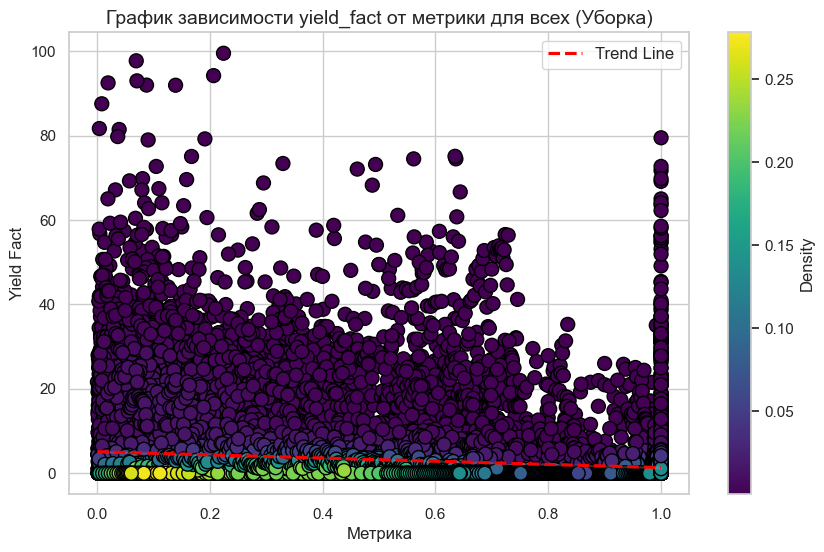

In [50]:
filtered_df = df[(df['work_type'] == 'Уборка') & (df['yield_fact'] < 100)]

# Извлекаем данные для построения графика
x = filtered_df['metric'].values
y = filtered_df['yield_fact'].values

# Вычисляем плотность точек с использованием gaussian_kde
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим точечный график с учетом плотности
sc = plt.scatter(x, y, c=z, s=100, cmap='viridis', edgecolor='black')

# Добавляем линию тренда
sns.regplot(x=x, y=y, scatter=False, color='red', line_kws={'linestyle': '--'}, label='Trend Line')

# Настройка графика
plt.title('График зависимости yield_fact от метрики для всех (Уборка)', fontsize=14)
plt.xlabel('Метрика', fontsize=12)
plt.ylabel('Yield Fact', fontsize=12)
plt.colorbar(sc, label='Density')  # Добавляем цветовую шкалу для плотности
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

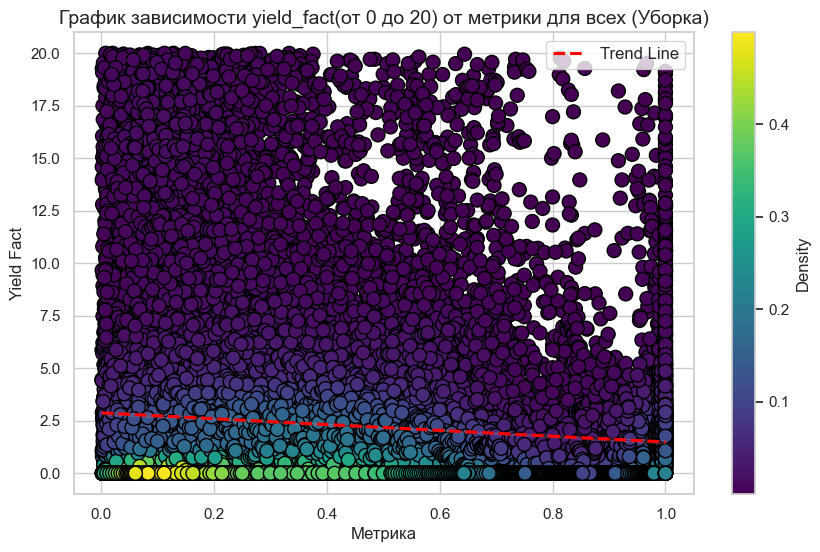

In [51]:
filtered_df = df[(df['work_type'] == 'Уборка') & (df['yield_fact'] < 20)]

# Извлекаем данные для построения графика
x = filtered_df['metric'].values
y = filtered_df['yield_fact'].values

# Вычисляем плотность точек с использованием gaussian_kde
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 6))  # Устанавливаем размер графика

# Строим точечный график с учетом плотности
sc = plt.scatter(x, y, c=z, s=100, cmap='viridis', edgecolor='black')

# Добавляем линию тренда
sns.regplot(x=x, y=y, scatter=False, color='red', line_kws={'linestyle': '--'}, label='Trend Line')

# Настройка графика
plt.title('График зависимости yield_fact(от 0 до 20) от метрики для всех (Уборка)', fontsize=14)
plt.xlabel('Метрика', fontsize=12)
plt.ylabel('Yield Fact', fontsize=12)
plt.colorbar(sc, label='Density')  # Добавляем цветовую шкалу для плотности
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

In [52]:
filtered_df = df[(df['work_type'] == 'Уборка') & (df['yield_fact'] < 100)]

# Извлекаем данные для построения графика
x = filtered_df['metric'].values
y = filtered_df['yield_fact'].values

# Вычисляем плотность точек с использованием gaussian_kde
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(100, 100))  # Устанавливаем размер графика

# Строим точечный график с учетом плотности
sc = plt.scatter(x, y, c=z, s=100, cmap='viridis', edgecolor='black')

# Добавляем линию тренда
sns.regplot(x=x, y=y, scatter=False, color='red', line_kws={'linestyle': '--'}, label='Trend Line')

# Настройка графика
plt.title('График зависимости yield_fact от метрики для всех (Уборка)', fontsize=14)
plt.xlabel('Метрика', fontsize=12)
plt.ylabel('Yield Fact', fontsize=12)
plt.colorbar(sc, label='Density')  # Добавляем цветовую шкалу для плотности
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

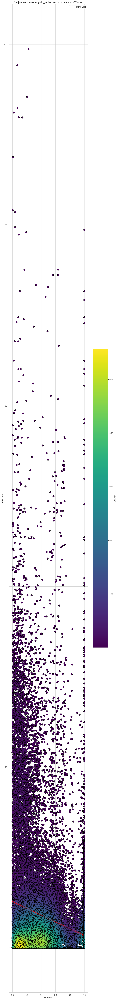

In [53]:
filtered_df = df[(df['work_type'] == 'Уборка') & (df['yield_fact'] < 100)]

# Извлекаем данные для построения графика
x = filtered_df['metric'].values
y = filtered_df['yield_fact'].values

# Вычисляем плотность точек с использованием gaussian_kde
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

# Построение графика с использованием seaborn
sns.set(style="whitegrid")  # Устанавливаем стиль сетки
plt.figure(figsize=(10, 100))  # Устанавливаем размер графика

# Строим точечный график с учетом плотности
sc = plt.scatter(x, y, c=z, s=100, cmap='viridis', edgecolor='black')

# Добавляем линию тренда
sns.regplot(x=x, y=y, scatter=False, color='red', line_kws={'linestyle': '--'}, label='Trend Line')

# Настройка графика
plt.title('График зависимости yield_fact от метрики для всех (Уборка)', fontsize=14)
plt.xlabel('Метрика', fontsize=12)
plt.ylabel('Yield Fact', fontsize=12)
plt.colorbar(sc, label='Density')  # Добавляем цветовую шкалу для плотности
plt.legend(fontsize=12)
plt.grid(True)

# Показываем график
plt.show()

In [54]:
import pandas as pd
from scipy.stats import pearsonr

correlation, p_value = pearsonr(df['metric'], df['yield_fact'])

print(f"Корреляция Пирсона: {correlation:.2f}")
print(f"p-value: {p_value:.4f}")

if p_value < 0.05:
    print("Гипотеза о линейной зависимости между metric и yield_fact подтверждена (p < 0.05).")
else:
    print("Нет статистически значимой линейной зависимости между metric и yield_fact (p >= 0.05).")

Корреляция Пирсона: -0.03
p-value: 0.0000
Гипотеза о линейной зависимости между metric и yield_fact подтверждена (p < 0.05).


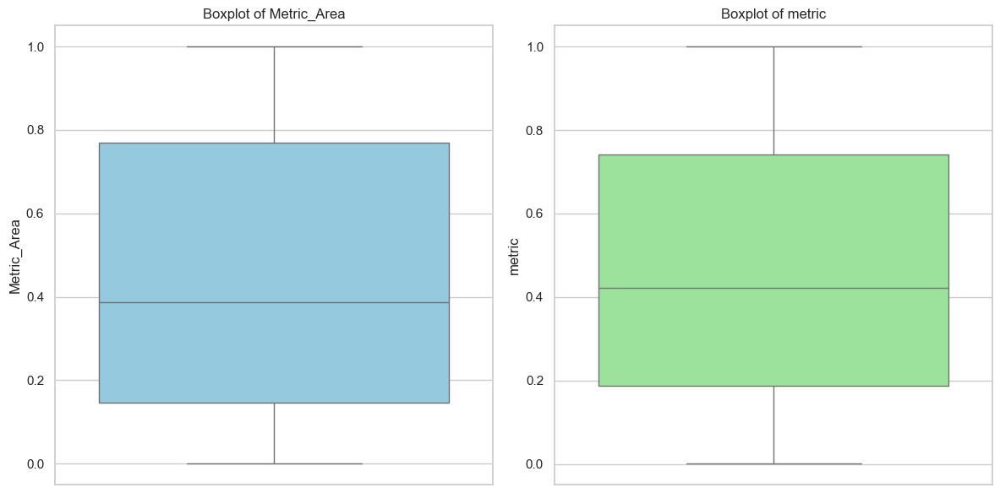

In [60]:
sns.set(style="whitegrid")

# Создаем фигуру и оси
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Боксплот для Metric_Area
sns.boxplot(y=df['Metric_Area'], ax=axes[0], color='skyblue')
axes[0].set_title('Boxplot of Metric_Area')
axes[0].set_ylabel('Metric_Area')

# Боксплот для metric
sns.boxplot(y=df['metric'], ax=axes[1], color='lightgreen')
axes[1].set_title('Boxplot of metric')
axes[1].set_ylabel('metric')

# Отображаем графики
plt.tight_layout()
plt.show()

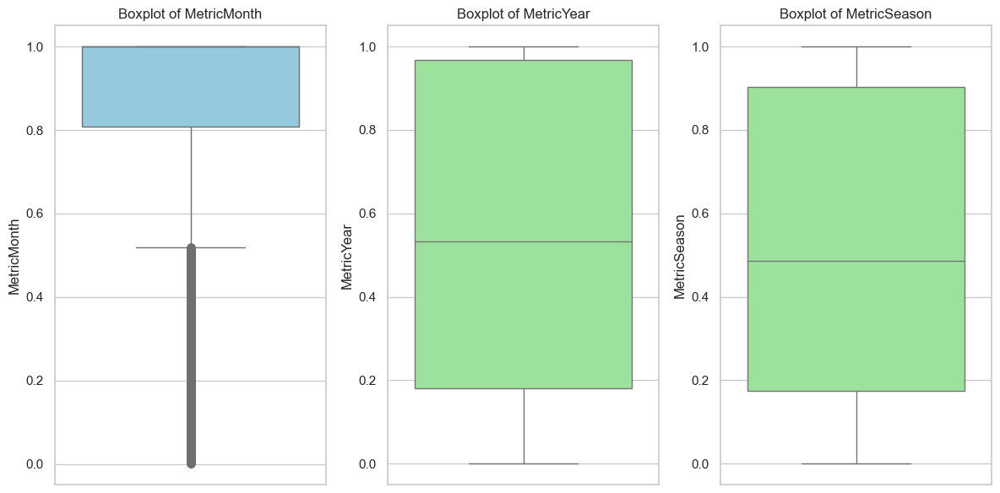

In [61]:
sns.set(style="whitegrid")

# Создаем фигуру и оси
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# Боксплот для Metric_Area
sns.boxplot(y=df['MetricMonth'], ax=axes[0], color='skyblue')
axes[0].set_title('Boxplot of MetricMonth')
axes[0].set_ylabel('MetricMonth')

# Боксплот для metric
sns.boxplot(y=df['MetricYear'], ax=axes[1], color='lightgreen')
axes[1].set_title('Boxplot of MetricYear')
axes[1].set_ylabel('MetricYear')

sns.boxplot(y=df['MetricSeason'], ax=axes[2], color='lightgreen')
axes[2].set_title('Boxplot of MetricSeason')
axes[2].set_ylabel('MetricSeason')

# Отображаем графики
plt.tight_layout()
plt.show()